# Assignment 1 - Simplified Custom Object Detection

This notebook contains the required task for the first assignment of the Deep Network Development course. Read the task description and fill in the empty code cells. Each section represents an implementation stage of object detection: -from `loading and inspecting the dataset`; -to `implementing`, `training and evaluating a Convolutional Neural Network based architecture`. The sections are there to guide you but you do not have to follow them strictly.

Copy this notebook to your drive (File -> Save a copy in Drive), edit it, and upload the final .ipynb file to [Canvas](https://canvas.elte.hu). If you are using this in Google Colab notebook, save it as .ipynb and upload it, or share the public link. If you have your own machine with Jupyter installed, you can work there as well, as long as you save and upload the .ipynb file.


## General Rules
Please check all the requirements listed on Canvas, but here are some general rules:
- Please select at least ANY 3 objects of choice. Try to pick unique objects. You may pick more, but less than 3 is not acceptable and results in losing points;
- While we do not require a high performance model, we still expect you to have a model that performs better than "random guessing" (i.e. for 3 objects, mAP should be better than 33%);
- Copying others' code will make you fail the assignment automatically, resulting in a 0;
- Not submitting anything results in a 0;
- Submitting something, as long as it is not an empty notebook, might result in a 1;
- **Deadline is October 25th Friday 11:59 PM** (strict, no late submission)
- Feel free to add more code cells as needed. But don't put code into external Python files.
- Please add your name, Neptun ID, and task details below.

**Name:**  WangXuhui
**Neptun ID:**LAWQUA
**Network:** CNN
**Objects:** Simplified Custom Object Detection

## Task description

**Your task** is to train your own custom object detection model and compare its performance with an existing object detection model (i.e., YOLO). For that, you need to generate a synthetic dataset to train your own custom model and fine-tune an existing one. This is a simplified version of object detection, where each image must only contain a single object.

- There is no expectation of high performance, but **your metrics should show results better than random guessing, and your loss must decrease throughout the epochs**.

- We expect you to visualize the key metrics such as precision, recall, F1-score, mAP (mean average precision), IoU (Intersection over Union), and localization loss, in addition to monitoring the overall loss and its reduction across training. Use plots and visualizations (e.g., matplotlib, seaborn) to display metrics, losses, and predictions.

- You should implement techniques to avoid overfitting, such as Early Stopping, and save the best-performing model during training.

- Additionally, you can use **WandB (Weights and Biases)** or **TensorBoard** to track and visualize training progress, monitor the model's performance, and log metrics over time.

`Good luck!`

**In order to get your grade for the assignment, you must defend it by answering questions during the designated practice time.**

## Guidelines
Please carefully read each cell of the notebook, as they contain guidelines to help you complete the assignments. While you don't have to follow them strictly, we believe that they provide enough help.

# 0. Necessary Imports
Import all the necessary packages for this assignment. **ONLY PYTORCH MODELS ARE ACCEPTED!**

In [ ]:
# ADD YOUR CODE HERE
import torch
import torchvision #has various utils functions, including loading datasets
import torchvision.transforms as transforms #common image transformations
from torch.utils.data import DataLoader
from PIL import Image
from torchvision import transforms
from torch.utils.data import Dataset

import shutil
import torch.nn as nn #creating neural network https://pytorch.org/docs/stable/nn.html
import torch.nn.functional as F #functional api for layers,...
import torch.optim as optim #for optimization algorithm
import matplotlib.pyplot as plt #for visualization
import matplotlib.image as mpimg
import numpy as np #for basic array operations
import os
import cv2
import random
from torch import nn
from torch.optim import Adam
from torch.utils.data import DataLoader



# 1. DATASET
**For this assignment you are free to pick any 3 objects of your choice.** Please avoid offensive, inappropriate or violent objects.

### 1.1. Load objects

**Please select 3 or more objects.** After selecting the objects, **remove the background, keeping only the object itself**. You can do this manually, online, or by using code (this step is not part of the assignment evaluation).

As an example, the following objects were chosen (with the background removed using the Segment Anything Model):

In [ ]:
#连接Google drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#删除 background 文件夹

# 检查background文件夹是否存在
background_dir = '/content/objects'

if os.path.exists(background_dir):
    # 删除整个background文件夹及其内容
    shutil.rmtree(background_dir)
    print(f"'{background_dir}' 文件夹已删除。")
else:
    print(f"'{background_dir}' 文件夹不存在。")

'/content/objects' 文件夹不存在。


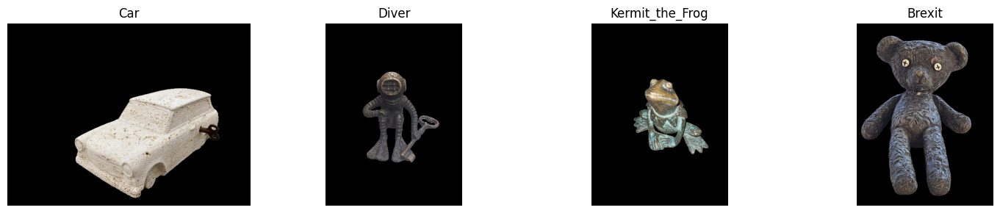

In [ ]:
# 检查并创建objects文件夹
dataset_dir = 'objects'
if not os.path.exists(dataset_dir):
    os.makedirs(dataset_dir)

# 检查并复制指定目录下的图片到objects文件夹
source_dir = '/content/drive/MyDrive/Deep_Network_Development/removebackground'
for file_name in os.listdir(source_dir):
    if file_name.endswith('.png'):
        source_path = os.path.join(source_dir, file_name)
        target_path = os.path.join(dataset_dir, file_name)
        shutil.copy(source_path, target_path)



#----------------------------------------------------------------------------------------------------
# 写一个display_objects_images(' ')函数，传入文件夹位置，对里面的图片进行可视化，上面是名字下面是图片。
def display_objects_images(image_folder_path):
  # 定义转换（Transforms），用于将图片转换成模型所需的张量
  transform = transforms.Compose([
       transforms.ToTensor()           # 转换为张量
  ])

    # 获取文件夹中的所有图片文件名
  image_filenames = os.listdir(image_folder_path)
    # 创建一个列表来存储每个图片的路径和标签
  dataset = []

  # 将每个图片的路径和标签添加到列表中
  for filename in image_filenames:
    label = os.path.splitext(filename)[0]  # 去掉文件后缀，假设文件名格式为 "label_image.png"
    image_path = os.path.join(image_folder_path, filename)
    dataset.append((image_path, label))

  # 定义一个函数来加载图片并应用转换
  def load_image(image_path):
    image = Image.open(image_path).convert('RGB')  # 以RGB模式打开图片
    image = transform(image)                      # 应用转换
    return image

  # 获取图片数量
  num_images = len(dataset)

  # 创建一个子图网格来显示图片和标签
  fig, axes = plt.subplots(1, num_images, figsize=(15, 3))

  # 循环遍历数据集，加载图片并展示
  for i, (image_path, label) in enumerate(dataset):
    image_tensor = load_image(image_path)

    # 转换为NumPy数组，并交换轴以适应matplotlib
    image_np = image_tensor.numpy().transpose((1, 2, 0))

    # 显示图片及其标签
    axes[i].imshow(image_np)
    axes[i].set_title(label)
    axes[i].axis('off')

  # 调整布局
  plt.tight_layout()

  # 显示图片
  plt.show()

#---------------------------------------------------------------------------------------

display_objects_images('/content/objects')


In [ ]:
import os
import cv2

def has_alpha_channel(image_path):
    # 使用 cv2.IMREAD_UNCHANGED 读取图片，保持所有通道（包括 alpha 通道）
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

    # 检查是否成功读取图片
    if image is None:
        print(f"无法读取图片: {image_path}")
        return False

    # 检查图片是否有4个通道（BGR + Alpha）
    if image.shape[2] == 4:
        return True
    else:
        return False

# 指定文件夹路径
folder_path = '/content/objects'

# 获取文件夹中的所有图片文件名
image_filenames = [file for file in os.listdir(folder_path) if file.endswith(('.png', '.jpg', '.jpeg'))]

# 遍历每张图片，检测是否有透明通道
for image_filename in image_filenames:
    image_path = os.path.join(folder_path, image_filename)

    # 检查图片是否有透明通道 Check if the image has a transparent channel
    if has_alpha_channel(image_path):
        print(f"图片 '{image_filename}' 有透明通道。")#With transparent channel
    else:
        print(f"图片 '{image_filename}' 没有透明通道。")



图片 'Car.png' 有透明通道。
图片 'Diver.png' 有透明通道。
图片 'Kermit_the_Frog.png' 有透明通道。
图片 'Brexit.png' 有透明通道。


In [ ]:

import os
import cv2
objects_dir = '/content/objects'
# 指定目标尺寸
target_size = (256, 256)

# 获取文件夹中所有图片文件的列表
image_filenames = os.listdir(objects_dir)

# 遍历每张图片，调整大小并覆盖保存
for image_filename in image_filenames:
    image_path = os.path.join(objects_dir, image_filename)

    # 使用 cv2.IMREAD_UNCHANGED 读取图片，保留 alpha 通道
    image = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

    # 检查是否成功读取图片
    if image is None:
        print(f"无法读取图片: {image_path}")
        continue

    # 检查图片是否有透明通道（是否为4通道图像）
    if image.shape[2] == 4:
        print(f"图片 '{image_filename}' 有透明通道。")
    else:
        print(f"图片 '{image_filename}' 没有透明通道，仅调整为3通道图片。")

    # 调整图片大小（对所有通道进行调整，包括透明通道）
    resized_image = cv2.resize(image, target_size)

    # 保存调整后的图片（覆盖原图片），确保保存时保留4通道
    cv2.imwrite(image_path, resized_image)

    print(f"图片已调整大小并保存: {image_path}")

print("所有图片的尺寸已调整为 256x256。")


图片 'Car.png' 有透明通道。
图片已调整大小并保存: /content/objects/Car.png
图片 'Diver.png' 有透明通道。
图片已调整大小并保存: /content/objects/Diver.png
图片 'Kermit_the_Frog.png' 有透明通道。
图片已调整大小并保存: /content/objects/Kermit_the_Frog.png
图片 'Brexit.png' 有透明通道。
图片已调整大小并保存: /content/objects/Brexit.png
所有图片的尺寸已调整为 256x256。


In [ ]:
# 指定对象图片文件夹路径
objects_dir = '/content/objects'

# 目标尺寸
target_size = (256, 256)

# 获取文件夹中所有图片文件的列表
image_filenames = os.listdir(objects_dir)

# 初始化计数器，统计不符合要求的图片
non_matching_images = []

# 遍历每张图片，检查大小
for image_filename in image_filenames:
    image_path = os.path.join(objects_dir, image_filename)

    # 读取图片
    image = cv2.imread(image_path)

    # 检查是否成功读取图片
    if image is None:
        print(f"无法读取图片: {image_path}")
        continue

    # 获取图片尺寸
    height, width = image.shape[:2]

    # 检查是否为640x640
    if (width, height) != target_size:
        non_matching_images.append(image_filename)
        print(f"图片大小不符合要求: {image_filename} - 尺寸为 {width}x{height}")

# 输出结果
if non_matching_images:
    print(f"\n共有 {len(non_matching_images)} 张图片不是 256x256 大小。")
else:
    print("所有图片的尺寸均为 256x256。")

所有图片的尺寸均为 256x256。


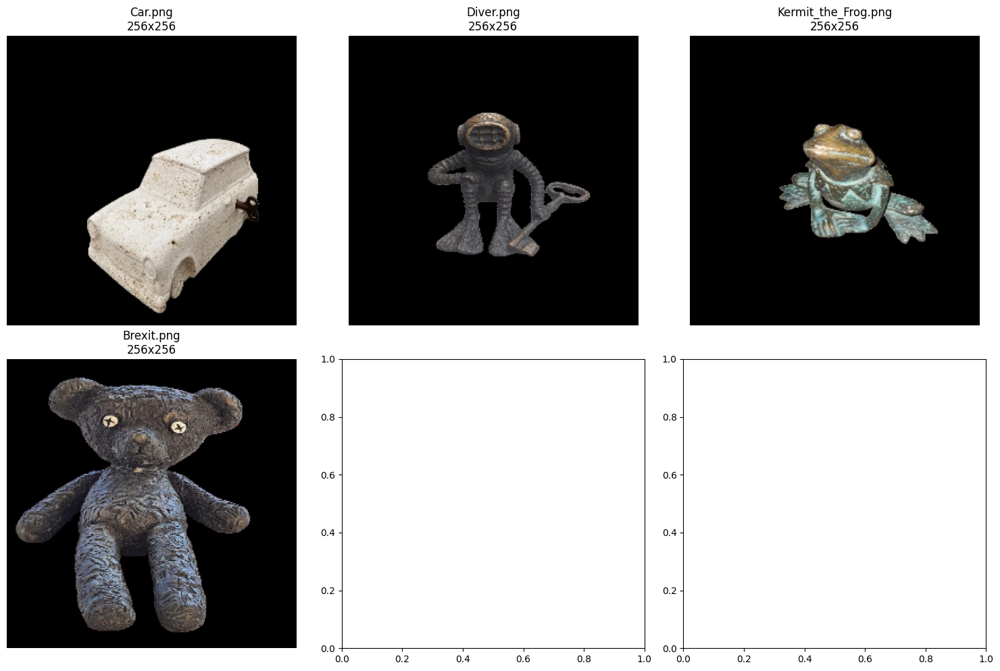

In [ ]:

# 获取文件夹中所有图片文件的列表
image_filenames = os.listdir(objects_dir)

# 设置图像展示的数量
num_images = len(image_filenames)

# 设置展示网格的大小
cols = 3
rows = (num_images // cols) + 1

# 创建子图
fig, axes = plt.subplots(rows, cols, figsize=(15, 5 * rows))

# 遍历每张图片，读取并显示
for i, image_filename in enumerate(image_filenames):
    image_path = os.path.join(objects_dir, image_filename)

    # 读取图片
    image = cv2.imread(image_path)
    if image is None:
        print(f"无法读取图片: {image_path}")
        continue

    # 获取图片尺寸
    height, width, _ = image.shape

    # 转换为RGB格式以适应matplotlib
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # 在子图上显示图片
    ax = axes[i // cols, i % cols]  # 找到对应的子图位置
    ax.imshow(image_rgb)
    ax.axis('off')  # 关闭坐标轴

    # 设置标题为图片的文件名和大小
    ax.set_title(f"{image_filename}\n{width}x{height}")

# 调整子图布局
plt.tight_layout()

# 显示图片
plt.show()

### 1.2. Load backgrounds

In [ ]:
#删除 background 文件夹

# 检查background文件夹是否存在
background_dir = '/content/background'

if os.path.exists(background_dir):
    # 删除整个background文件夹及其内容
    shutil.rmtree(background_dir)
    print(f"'{background_dir}' 文件夹已删除。")
else:
    print(f"'{background_dir}' 文件夹不存在。")


'/content/background' 文件夹不存在。


In order to train a custom object detection model, a dataset is needed. For this assignment, a synthetic dataset should be created by:

- **Inserting an object in a random position** on a background image.

**Therefore, collect a few background images from different locations** This can be done manually or via code.

It is recommended to use **icrawler** to automate the image collection process.


In [ ]:
!pip install icrawler

In [ ]:
!mkdir background

In case of any errors, try using a different crawler. You can use one of the following options:

```python
from icrawler.builtin import BaiduImageCrawler, BingImageCrawler, GoogleImageCrawler


Download the image to Google Drive

In [ ]:
# from icrawler.builtin import GoogleImageCrawler

# google_crawler = GoogleImageCrawler(
#     parser_threads=2,
#     downloader_threads=4,
#     storage={'root_dir': '/content/drive/MyDrive/DND_硕士第一学期/DND大作业/background'}
# )

# keywords = ['budapest', 'budapest parliament', 'buda castle', 'budapest st stephen basilica', 'budapest heroes square']

# for keyword in keywords:
#     try:
#         google_crawler.crawl(
#             keyword=keyword, max_num=80, file_idx_offset='auto', min_size=(500, 500)
#         )
#     except Exception as e:
#         print(f"Error downloading images for '{keyword}': {e}")


Copy the image in /content/drive/MyDrive/DND_Master's First Semester/DND Homework/background to /content/background

In [ ]:
import shutil

source_dir = '/content/drive/MyDrive/DND_硕士第一学期/DND大作业/background'
destination_dir = '/content/background'

# 复制整个文件夹
shutil.copytree(source_dir, destination_dir, dirs_exist_ok=True)


'/content/background'

In [ ]:
#归一化处理 使背景图片的大小为640*640

# 指定背景图片文件夹路径
background_dir = '/content/background'

# 指定目标尺寸
target_size = (640, 640)

# 获取文件夹中所有图片文件的列表
image_filenames = os.listdir(background_dir)

# 遍历每张图片，调整大小并覆盖保存
for image_filename in image_filenames:
    image_path = os.path.join(background_dir, image_filename)

    # 读取图片
    image = cv2.imread(image_path)

    # 检查是否成功读取图片
    if image is None:
        print(f"无法读取图片: {image_path}")
        continue

    # 调整图片大小
    resized_image = cv2.resize(image, target_size)

    # 保存调整后的图片（覆盖原图片）
    cv2.imwrite(image_path, resized_image)

    print(f"图片已调整大小并保存: {image_path}")

print("所有图片的尺寸已调整为 640x640。")


图片已调整大小并保存: /content/background/000117.jpg
图片已调整大小并保存: /content/background/000044.jpg
图片已调整大小并保存: /content/background/000183.jpg
图片已调整大小并保存: /content/background/000051.jpg
图片已调整大小并保存: /content/background/000230.jpg
图片已调整大小并保存: /content/background/000053.jpg
图片已调整大小并保存: /content/background/000178.jpg
图片已调整大小并保存: /content/background/000167.jpg
图片已调整大小并保存: /content/background/000011.jpg
图片已调整大小并保存: /content/background/000067.png
图片已调整大小并保存: /content/background/000107.jpg
图片已调整大小并保存: /content/background/000007.jpg
图片已调整大小并保存: /content/background/000002.jpg
图片已调整大小并保存: /content/background/000108.jpg
图片已调整大小并保存: /content/background/000157.jpg
图片已调整大小并保存: /content/background/000075.jpg
图片已调整大小并保存: /content/background/000018.jpg
图片已调整大小并保存: /content/background/000081.jpg
图片已调整大小并保存: /content/background/000215.jpg
图片已调整大小并保存: /content/background/000231.jpg
图片已调整大小并保存: /content/background/000082.jpg
图片已调整大小并保存: /content/background/000095.jpg
图片已调整大小并保存: /content/background/000068.jpg
图片已调整大小并保存:

In [ ]:
#检测是否有图片不是640*640大小的

# 指定背景图片文件夹路径
background_dir = '/content/background'

# 目标尺寸
target_size = (640, 640)

# 获取文件夹中所有图片文件的列表
image_filenames = os.listdir(background_dir)

# 初始化计数器，统计不符合要求的图片
non_matching_images = []

# 遍历每张图片，检查大小
for image_filename in image_filenames:
    image_path = os.path.join(background_dir, image_filename)

    # 读取图片
    image = cv2.imread(image_path)

    # 检查是否成功读取图片
    if image is None:
        print(f"无法读取图片: {image_path}")
        continue

    # 获取图片尺寸
    height, width = image.shape[:2]

    # 检查是否为640x640
    if (width, height) != target_size:
        non_matching_images.append(image_filename)
        print(f"图片大小不符合要求: {image_filename} - 尺寸为 {width}x{height}")

# 输出结果
if non_matching_images:
    print(f"\n共有 {len(non_matching_images)} 张图片不是 640x640 大小。")
else:
    print("所有图片的尺寸均为 640x640。")


所有图片的尺寸均为 640x640。


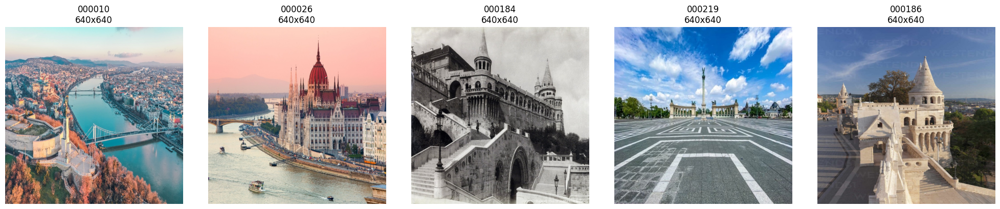

'/content/background' 文件夹中共有 243 个文件。


In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

def display_sample_images(folder_path):
    # 获取文件夹中的图片列表
    image_files = [file for file in os.listdir(folder_path) if file.endswith('.jpg')]

    # 随机选择5张图片
    random_image_files = random.sample(image_files, min(len(image_files), 5))

    # 创建画布
    num_images = len(random_image_files)
    num_rows = 1 if num_images == 0 else (num_images + 4) // 5  # 每行显示5张图片
    fig, axes = plt.subplots(num_rows, 5, figsize=(20, num_rows*4))

    # 遍历并显示图片
    for i, image_file in enumerate(random_image_files):
        row = 1
        col = i % 5

        # 读取并显示图片
        image_path = os.path.join(folder_path, image_file)
        img = mpimg.imread(image_path)

        # 获取图片尺寸
        img_height, img_width = img.shape[:2]

        # 如果只有一行图片，单独处理
        if num_rows == 1:
            axes[col].imshow(img)
            axes[col].set_title(f"{image_file[:-4]}\n{img_width}x{img_height}", fontsize=12)  # 显示文件名和尺寸
            axes[col].axis('off')
        else:
            axes[i // 5, col].imshow(img)
            axes[i // 5, col].set_title(f"{image_file[:-4]}\n{img_width}x{img_height}", fontsize=12)  # 显示文件名和尺寸
            axes[i // 5, col].axis('off')

    plt.tight_layout()
    plt.show()

#-----------------------------------------------------------------------------------------
directory = '/content/background'

# 展示图片，确认图片是否成功获取
display_sample_images(directory)

# 统计文件数量并显示
files = os.listdir(directory)
num_files = len(files)
print(f"'{directory}' 文件夹中共有 {num_files} 个文件。")

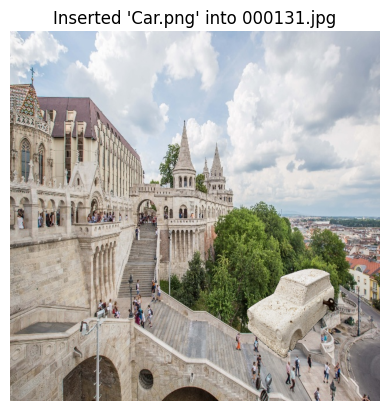

YOLO格式边界框信息:  [1, 0.7296875, 0.7, 0.4, 0.4]


In [ ]:
import os
import random
import cv2
import matplotlib.pyplot as plt

# 定义插入对象到背景图片的函数
def insert_object_into_background(background_img, object_img, object_type, save_label=True, label_dir='./labels', img_filename="output"):
    # 获取背景图片尺寸
    bg_height, bg_width, _ = background_img.shape

    # 获取对象图片尺寸
    obj_height, obj_width, obj_channels = object_img.shape

    # 随机选择插入位置，确保对象完全在背景图片中
    x = random.randint(0, bg_width - obj_width)
    y = random.randint(0, bg_height - obj_height)

    # 检查对象图片是否有透明通道
    if obj_channels == 4:
        # 创建对象掩码（alpha通道），选择非透明部分
        object_mask = (object_img[:, :, 3] > 0)
        background_img[y:y+obj_height, x:x+obj_width][object_mask] = object_img[:, :, :3][object_mask]
    else:
        # 没有透明通道，直接插入
        background_img[y:y+obj_height, x:x+obj_width] = object_img

    # 生成YOLO格式的边界框信息
    x_center = (x + obj_width / 2) / bg_width
    y_center = (y + obj_height / 2) / bg_height
    width = obj_width / bg_width
    height = obj_height / bg_height

    # YOLO标签数据：class_id, x_center, y_center, width, height
    yolo_bbox = [object_type, x_center, y_center, width, height]

    # 如果指定了保存标签
    if save_label:
        os.makedirs(label_dir, exist_ok=True)
        label_path = os.path.join(label_dir, f"{img_filename}.txt")

        # 保存YOLO格式的标签文件
        with open(label_path, 'w') as f:
            f.write(' '.join(map(str, yolo_bbox)) + '\n')

    # 返回合成后的图片和对应的YOLO边界框
    return background_img, yolo_bbox

# 示例调用，随机插入一个对象并生成锚框
background_dir = '/content/background'
object_img_path = '/content/objects/Car.png'
label_dir = './labels'

# 读取随机背景图片
background_files = [file for file in os.listdir(background_dir) if file.endswith('.jpg') or file.endswith('.png')]
random_background_file = random.choice(background_files)
background_img_path = os.path.join(background_dir, random_background_file)
background_img = cv2.imread(background_img_path)

# 读取对象图片（含透明通道）
object_img = cv2.imread(object_img_path, cv2.IMREAD_UNCHANGED)

# 假设 object_type 为 1 (对应 "car")
object_type = 1

# 插入对象并返回合成图片及YOLO边界框，同时保存标签
result_img, yolo_bbox = insert_object_into_background(background_img, object_img, object_type, save_label=True, label_dir=label_dir, img_filename="car_example")

# 转换颜色通道，从BGR到RGB（因为matplotlib使用RGB显示）
result_img_rgb = cv2.cvtColor(result_img, cv2.COLOR_BGR2RGB)

# 显示合成后的图片
plt.imshow(result_img_rgb)
plt.axis('off')
plt.title(f"Inserted 'Car.png' into {random_background_file}")
plt.show()

# 输出生成的YOLO边界框
print("YOLO格式边界框信息: ", yolo_bbox)



In [ ]:
#删除 /content/yolo_dataset 文件夹

# 检查background文件夹是否存在
background_dir = '/content/yolo_dataset'

if os.path.exists(background_dir):
    # 删除整个background文件夹及其内容
    shutil.rmtree(background_dir)
    print(f"'{background_dir}' 文件夹已删除。")
else:
    print(f"'{background_dir}' 文件夹不存在。")

'/content/yolo_dataset' 文件夹不存在。


### 1.3. Create dataset

### Dataset Creation

This is a crucial part of the assignment evaluation. From the selected objects and collected background images, follow these steps to generate your dataset:

1. **Randomly select background images** from your collection.
2. **Insert a single object** (from the three selected) into each background image at a **random location**.
3. **Record the object's coordinates** and create a corresponding bounding box. For example:
   - If an object with height `h` and width `w` is placed at position `(x, y)`, the bounding box should be in one of the following formats:
     - **[x, y, w, h]** or
     - **[x1, y1, x2, y2]**, where `x2 = x1 + w` and `y2 = y1 + h`.
4. If you plan to compare your custom model with a YOLO model, use the **YOLO bounding box format**:
   - `[(x + w/2)/image_width, (y + h/2)/image_height, w/image_width, h/image_height]`, where `image` refers to the background image dimensions.
5. **Save the generated dataset**, as it will be used for training your custom model and fine-tuning the existing object detection model.
6. **Wrap the dataset creation** in a **PyTorch Dataset class** for easier data handling and model training.
7. **Split the dataset** into training, validation, and test sets to evaluate your model effectively.


In [ ]:
import os
import random
import cv2

# 定义插入对象到背景图片并生成标签的函数
def insert_object_and_generate_label(background_img, object_img, object_type, label_dir, img_filename):
    bg_height, bg_width, _ = background_img.shape
    obj_height, obj_width, obj_channels = object_img.shape

    # 随机选择插入位置
    x = random.randint(0, bg_width - obj_width)
    y = random.randint(0, bg_height - obj_height)

    # 检查对象图片是否有透明通道
    if obj_channels == 4:
        object_mask = (object_img[:, :, 3] > 0)
        background_img[y:y+obj_height, x:x+obj_width][object_mask] = object_img[:, :, :3][object_mask]
    else:
        background_img[y:y+obj_height, x:x+obj_width] = object_img

    # 计算YOLO格式的边界框
    x_center = (x + obj_width / 2) / bg_width
    y_center = (y + obj_height / 2) / bg_height
    width = obj_width / bg_width
    height = obj_height / bg_height
    yolo_bbox = [object_type, x_center, y_center, width, height]

    # 保存YOLO标签
    os.makedirs(label_dir, exist_ok=True)
    label_path = os.path.join(label_dir, f"{img_filename}.txt")
    with open(label_path, 'w') as f:
        f.write(' '.join(map(str, yolo_bbox)) + '\n')

    return background_img, yolo_bbox

# 创建数据集的函数
def createDataset(root_dir, dataset_name, split, img_size, num_images):
    dataset_dir = os.path.join(root_dir, dataset_name)

    # 创建目录结构
    train_img_dir = os.path.join(dataset_dir, 'train', 'images')
    train_label_dir = os.path.join(dataset_dir, 'train', 'labels')
    val_img_dir = os.path.join(dataset_dir, 'val', 'images')
    val_label_dir = os.path.join(dataset_dir, 'val', 'labels')
    test_img_dir = os.path.join(dataset_dir, 'test', 'images')
    test_label_dir = os.path.join(dataset_dir, 'test', 'labels')

    os.makedirs(train_img_dir, exist_ok=True)
    os.makedirs(train_label_dir, exist_ok=True)
    os.makedirs(val_img_dir, exist_ok=True)
    os.makedirs(val_label_dir, exist_ok=True)
    os.makedirs(test_img_dir, exist_ok=True)
    os.makedirs(test_label_dir, exist_ok=True)

    background_dir = os.path.join(root_dir, 'background')
    object_dir = os.path.join(root_dir, 'objects')

    # 获取所有背景图片
    background_files = [file for file in os.listdir(background_dir) if file.endswith('.jpg') or file.endswith('.png')]
    object_files = [file for file in os.listdir(object_dir) if file.endswith('.png')]

    # 打乱背景图片顺序
    random.shuffle(background_files)

    # 划分数据集大小
    train_size = int(num_images * split['train'])
    val_size = int(num_images * split['val'])
    test_size = num_images - train_size - val_size

    # 定义一个函数来循环使用背景文件
    def get_background_file(index, total_files):
        return background_files[index % total_files]

    print(f"训练集大小: {train_size}, 验证集大小: {val_size}, 测试集大小: {test_size}")

    # 处理数据集生成过程
    def process_dataset(num_images, img_dir, label_dir, dataset_type, total_background_files):
        for i in range(num_images):
            background_file = get_background_file(i, total_background_files)
            background_img_path = os.path.join(background_dir, background_file)
            background_img = cv2.imread(background_img_path)

            # 随机选择一个对象图片
            random_object_file = random.choice(object_files)
            object_img_path = os.path.join(object_dir, random_object_file)
            object_img = cv2.imread(object_img_path, cv2.IMREAD_UNCHANGED)

            # 根据对象图片名设置类别
            if "Brexit" in random_object_file:
                object_type = 0
            elif "Car" in random_object_file:
                object_type = 1
            elif "Diver" in random_object_file:
                object_type = 2
            elif "Kermit_the_Frog" in random_object_file:
                object_type = 3
            else:
                object_type = 4  # 默认类别

            # 生成文件名
            img_filename = f"{dataset_type}_{i+1:05d}"

            # 插入对象并生成YOLO标签
            result_img, yolo_bbox = insert_object_and_generate_label(background_img, object_img, object_type, label_dir, img_filename)

            # 保存图片
            img_save_path = os.path.join(img_dir, f"{img_filename}.jpg")
            cv2.imwrite(img_save_path, result_img)

            print(f"{dataset_type} - 图片已保存: {img_save_path}，标签: {yolo_bbox}")

    # 分别生成训练集、验证集、测试集，循环使用背景图片
    print("生成训练集...")
    process_dataset(train_size, train_img_dir, train_label_dir, 'train', len(background_files))

    print("生成验证集...")
    process_dataset(val_size, val_img_dir, val_label_dir, 'val', len(background_files))

    print("生成测试集...")
    process_dataset(test_size, test_img_dir, test_label_dir, 'test', len(background_files))

    print(f"数据集生成完毕：训练集 {train_size} 张，验证集 {val_size} 张，测试集 {test_size} 张。")

# 示例调用
root_dir = '/content'
dataset_name = 'yolo_dataset'
split = {'train': 0.8, 'val': 0.1, 'test': 0.1}
img_size = (640, 640)
num_images = 2000

createDataset(root_dir, dataset_name, split, img_size, num_images)












#createDataset('dataset', 'background', split='train', img_size=(640,640), num_images=5000)
#createDataset('dataset', 'background', split='val', img_size=(640,640), num_images=1000)
#createDataset('dataset', 'background', split='test', img_size=(640,640), num_images=200)

训练集大小: 1600, 验证集大小: 200, 测试集大小: 200
生成训练集...
train - 图片已保存: /content/yolo_dataset/train/images/train_00001.jpg，标签: [2, 0.534375, 0.3390625, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00002.jpg，标签: [2, 0.5390625, 0.2390625, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00003.jpg，标签: [2, 0.4171875, 0.7734375, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00004.jpg，标签: [1, 0.553125, 0.7796875, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00005.jpg，标签: [1, 0.3453125, 0.2875, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00006.jpg，标签: [2, 0.26875, 0.7375, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00007.jpg，标签: [2, 0.7, 0.2265625, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00008.jpg，标签: [2, 0.328125, 0.6796875, 0.4, 0.4]
train - 图片已保存: /content/yolo_dataset/train/images/train_00009.jpg，标签: [0, 0.7734375, 0.5625, 0.4, 0.4]
train - 图片已保存: /conte

In [ ]:
import os

# 指定目录路径
val_images_dir = '/content/yolo_dataset/train/images'

# 查询该目录下的文件
if os.path.exists(val_images_dir):
    files = os.listdir(val_images_dir)
    # 过滤非文件项
    files = [f for f in files if os.path.isfile(os.path.join(val_images_dir, f))]

    # 打印文件数量和文件名
    print(f"该目录中共有 {len(files)} 个文件。")

else:
    print(f"目录 {val_images_dir} 不存在。")


该目录中共有 1600 个文件。


In [ ]:
import os

# 指定目录路径
val_images_dir = '/content/yolo_dataset/val/images'

# 查询该目录下的文件
if os.path.exists(val_images_dir):
    files = os.listdir(val_images_dir)
    # 过滤非文件项
    files = [f for f in files if os.path.isfile(os.path.join(val_images_dir, f))]

    # 打印文件数量和文件名
    print(f"该目录中共有 {len(files)} 个文件。")

else:
    print(f"目录 {val_images_dir} 不存在。")

该目录中共有 200 个文件。


In [ ]:
import os

# 指定目录路径
val_images_dir = '/content/yolo_dataset/test/images'

# 查询该目录下的文件
if os.path.exists(val_images_dir):
    files = os.listdir(val_images_dir)
    # 过滤非文件项
    files = [f for f in files if os.path.isfile(os.path.join(val_images_dir, f))]

    # 打印文件数量和文件名
    print(f"该目录中共有 {len(files)} 个文件。")

else:
    print(f"目录 {val_images_dir} 不存在。")

该目录中共有 200 个文件。


In [ ]:
import yaml

# 定义 data.yaml 文件内容
data_config = {
    'train': '/content/yolo_dataset/train/images',
    'val': '/content/yolo_dataset/val/images',
    'test': '/content/yolo_dataset/test/images',
    'nc': 4,  # 类别数量
    'names': ['Brexit', 'Car', 'Diver', 'Kermit_the_Frog']  # 类别名称
}

# 保存为 data.yaml 文件
with open('/content/yolo_dataset/data.yaml', 'w') as file:
    yaml.dump(data_config, file, default_flow_style=False)

print("data.yaml 文件已生成")

data.yaml 文件已生成


In [ ]:
import os
import torch
from torch.utils.data import Dataset
import cv2

class ObjectDetectionDataset(Dataset):
    def __init__(self, root_dir, split='train', num_classes=3, transform=None):
        """
        初始化数据集
        root_dir: 数据集的根目录
        split: 数据集的划分（'train', 'val', 'test'）
        num_classes: 类别数
        transform: 可选的图像增强或预处理
        """
        self.root_dir = root_dir
        self.split_dir = os.path.join(root_dir, split)
        self.image_dir = os.path.join(self.split_dir, 'images')
        self.label_dir = os.path.join(self.split_dir, 'labels')
        self.image_filenames = sorted(os.listdir(self.image_dir))
        self.transform = transform
        self.num_classes = num_classes

    def __len__(self):
        """
        返回数据集中图像的数量
        """
        return len(self.image_filenames)

    def __getitem__(self, idx):
        """
        返回指定索引的图像、类别和边界框
        idx: 数据集索引
        """
        # 获取图片路径和对应的标签路径
        img_path = os.path.join(self.image_dir, self.image_filenames[idx])
        label_path = os.path.join(self.label_dir, self.image_filenames[idx].replace('.jpg', '.txt'))

        # 读取图片
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # 读取YOLO标签文件 (class_id, x_center, y_center, width, height)
        with open(label_path, 'r') as f:
            label = f.readline().strip().split()
            category = int(label[0])  # 类别标签
            bbox = list(map(float, label[1:]))  # YOLO格式的边界框 (x_center, y_center, w, h)

        # 应用transform（如果定义了）
        if self.transform:
            image = self.transform(image)

        # 返回图像、类别标签和边界框
        return image, torch.tensor(category), torch.tensor(bbox)


In [ ]:
root_dir = '/content/yolo_dataset'
transform = transforms.Compose([
    transforms.ToTensor(),
])

train_dataset = ObjectDetectionDataset(root_dir, split='train', transform=transform)
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=4, pin_memory=True)

val_dataset = ObjectDetectionDataset(root_dir, split='val', transform=transform)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=4, pin_memory=True)


test_dataset = ObjectDetectionDataset(root_dir, split='test', transform=transform)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=4, pin_memory=True)

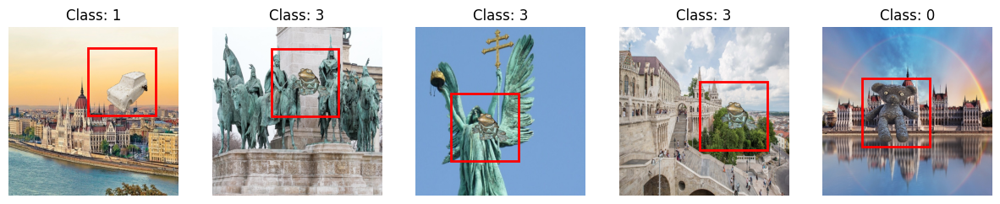

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# 可视化数据集中的一些图像和标签
def visualize_dataset(dataset, num_samples=5):
    # 随机选择 num_samples 个样本进行可视化
    indices = np.random.choice(len(dataset), num_samples, replace=False)

    plt.figure(figsize=(15, 5))

    for i, idx in enumerate(indices):
        # 从数据集中获取图像、类别和边界框
        image, category, bbox = dataset[idx]

        # 取消图像的归一化（如果需要）
        if isinstance(image, torch.Tensor):
            # 调整维度从 [C, H, W] 到 [H, W, C]
            image = image.permute(1, 2, 0).numpy()

        plt.subplot(1, num_samples, i+1)
        plt.imshow(image)

        # 显示边界框 (YOLO格式转换为 [x_min, y_min, x_max, y_max])
        h, w, _ = image.shape
        x_center, y_center, width, height = bbox
        x_min = int((x_center - width / 2) * w)
        y_min = int((y_center - height / 2) * h)
        x_max = int((x_center + width / 2) * w)
        y_max = int((y_center + height / 2) * h)

        # 绘制边界框
        plt.gca().add_patch(plt.Rectangle((x_min, y_min), x_max - x_min, y_max - y_min,
                                          edgecolor='red', fill=False, linewidth=2))

        plt.title(f"Class: {category.item()}")
        plt.axis('off')

    plt.show()

# 可视化训练集中的一些图像和标签
visualize_dataset(train_dataset)



### 2. MODELS

In this assignment, you are tasked with building your own custom object detection model and comparing its performance against an existing object detection model.


### 2.1. Custom Object Detection model

### Create a Convolutional Neural Network (CNN) Architecture

Design a CNN-based architecture that includes a **backbone for feature extraction** and two output branches:

- One for **class probabilities** (with output size equal to the number of object classes, e.g., 3).
- Another for **bounding box regression** (with size 4 for the box coordinates: x, y, w, h, or in your chosen format).

This is the core evaluation of the assignment. Experiment with different layers, hyperparameters, and regularization techniques to optimize the model's performance.


In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class CustomModel(nn.Module):
    def __init__(self, num_classes=4):
        super(CustomModel, self).__init__()

        self.backbone = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(32, 64, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(64, 128, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            nn.Conv2d(128, 256, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        # 全局平均池化（Global Average Pooling）
        self.global_avg_pool = nn.AdaptiveAvgPool2d((1, 1))

        # 检测层：优化全连接层结构（Detection layer: Optimize the fully connected layer structure）
        self.classifier = nn.Sequential(
            nn.Linear(256, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, num_classes),
            nn.Softmax(dim=1)
        )
        self.regressor = nn.Sequential(
            nn.Linear(256, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(512, 4)
        )

    def forward(self, x):
        # 特征提取（Feature extraction）
        features = self.backbone(x)
        features = self.global_avg_pool(features)
        features = features.view(features.size(0), -1)

        # 分类概率（Classification probability）
        class_probs = self.classifier(features)

        # 边界框回归（Bounding Box Regression）
        bbox_regression = self.regressor(features)
        return class_probs, bbox_regression


In [ ]:
dummy_image = torch.randn(1, 3, 640, 640).to(device)
num_classes = 4

model = CustomModel(num_classes).to(device)
cls_output, bbox_output = model(dummy_image)

print("Class Output Shape:", cls_output.shape)
print("Bounding Box Output Shape:", bbox_output.shape)

Class Output Shape: torch.Size([1, 4])
Bounding Box Output Shape: torch.Size([1, 4])


### 2.2. Train Your Model

Carefully choose key components like the **optimizer**, **loss function**, **number of epochs**, and **regularization techniques**. Ensure you're optimizing both **classification loss** and **bounding box regression loss**.

Monitor for signs of **overfitting** or **underfitting** by tracking how the loss evolves across epochs. The loss should consistently decrease as training progresses. Save and log these losses for visualization and further analysis.


**Example Plot**:

<a href="https://ibb.co/bzmMxJY"><img src="https://i.ibb.co/t8KTSXn/download.png" alt="download" border="0"></a>

Epoch [1/50], Train Class Loss: 1.3979, Train Bbox Loss: 0.0285, Val Class Loss: 1.3854, Val Bbox Loss: 0.0163
Best model saved with val_loss: 1.4017
Epoch [2/50], Train Class Loss: 1.3896, Train Bbox Loss: 0.0216, Val Class Loss: 1.3873, Val Bbox Loss: 0.0155
Epoch [3/50], Train Class Loss: 1.3854, Train Bbox Loss: 0.0206, Val Class Loss: 1.3764, Val Bbox Loss: 0.0171
Best model saved with val_loss: 1.3935
Epoch [4/50], Train Class Loss: 1.3754, Train Bbox Loss: 0.0204, Val Class Loss: 1.3719, Val Bbox Loss: 0.0162
Best model saved with val_loss: 1.3881
Epoch [5/50], Train Class Loss: 1.3223, Train Bbox Loss: 0.0195, Val Class Loss: 1.2909, Val Bbox Loss: 0.0183
Best model saved with val_loss: 1.3092
Epoch [6/50], Train Class Loss: 1.2563, Train Bbox Loss: 0.0186, Val Class Loss: 1.2074, Val Bbox Loss: 0.0169
Best model saved with val_loss: 1.2244
Epoch [7/50], Train Class Loss: 1.2049, Train Bbox Loss: 0.0188, Val Class Loss: 1.2690, Val Bbox Loss: 0.0167
Epoch [8/50], Train Class Lo

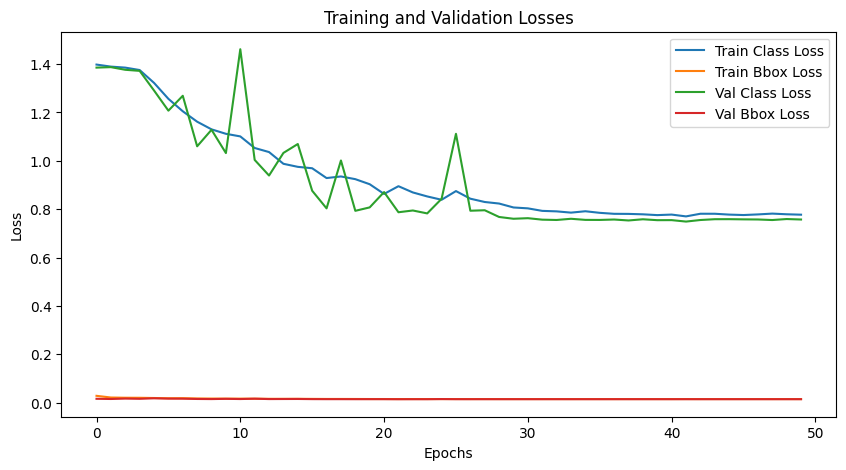

模型配置已保存到 'model_config.json'


In [ ]:
#15:36 经过chatgpt优化后的代码！！！！！！！！！！！！！！！！！！！！！！！
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import json

# 假设 model 已经定义好
# 定义优化器和损失函数
optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)  # Adam优化器，学习率为0.001（Adam optimizer with a learning rate of 0.001）
class_loss_fn = nn.CrossEntropyLoss()  # 分类损失函数（Classification loss function）
bbox_loss_fn = nn.MSELoss()  # 边界框回归损失函数（Bounding Box Regression Loss Function）

# 学习率调度器（可选）
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1)

# 训练模型的函数
def train_model(model, train_loader, val_loader, optimizer, class_loss_fn, bbox_loss_fn, scheduler=None, num_epochs=10):
    train_class_losses = []
    train_bbox_losses = []
    val_class_losses = []
    val_bbox_losses = []

    device = 'cuda' if torch.cuda.is_available() else 'cpu'
    model.to(device)

    best_val_loss = float('inf')  # 初始化最小验证损失

    for epoch in range(num_epochs):
        model.train()  # 设置为训练模式
        running_class_loss = 0.0
        running_bbox_loss = 0.0

        # 训练过程
        for images, labels, boxes in train_loader:
            images, labels, boxes = images.to(device), labels.to(device), boxes.to(device)

            # 梯度清零
            optimizer.zero_grad()

            # 前向传播
            class_probs, bbox_preds = model(images)

            # 计算损失
            class_loss = class_loss_fn(class_probs, labels)
            bbox_loss = bbox_loss_fn(bbox_preds, boxes)
            loss = class_loss + bbox_loss

            # 反向传播和优化
            loss.backward()
            optimizer.step()

            running_class_loss += class_loss.item()
            running_bbox_loss += bbox_loss.item()

        # 记录每个epoch的平均训练损失
        epoch_class_loss = running_class_loss / len(train_loader)
        epoch_bbox_loss = running_bbox_loss / len(train_loader)

        train_class_losses.append(epoch_class_loss)
        train_bbox_losses.append(epoch_bbox_loss)

        # 验证集上的损失
        model.eval()  # 设置为评估模式
        val_running_class_loss = 0.0
        val_running_bbox_loss = 0.0
        with torch.no_grad():
            for images, labels, boxes in val_loader:
                images, labels, boxes = images.to(device), labels.to(device), boxes.to(device)
                class_probs, bbox_preds = model(images)

                class_loss = class_loss_fn(class_probs, labels)
                bbox_loss = bbox_loss_fn(bbox_preds, boxes)
                loss = class_loss + bbox_loss

                val_running_class_loss += class_loss.item()
                val_running_bbox_loss += bbox_loss.item()

        val_epoch_class_loss = val_running_class_loss / len(val_loader)
        val_epoch_bbox_loss = val_running_bbox_loss / len(val_loader)

        val_class_losses.append(val_epoch_class_loss)
        val_bbox_losses.append(val_epoch_bbox_loss)

        print(f'Epoch [{epoch+1}/{num_epochs}], '
              f'Train Class Loss: {epoch_class_loss:.4f}, Train Bbox Loss: {epoch_bbox_loss:.4f}, '
              f'Val Class Loss: {val_epoch_class_loss:.4f}, Val Bbox Loss: {val_epoch_bbox_loss:.4f}')

        # 保存验证损失最小的模型（Save the model with the lowest validation loss）
        val_total_loss = val_epoch_class_loss + val_epoch_bbox_loss
        if val_total_loss < best_val_loss:
            best_val_loss = val_total_loss
            torch.save(model.state_dict(), 'best_model_weights.pth')
            print(f"Best model saved with val_loss: {best_val_loss:.4f}")

        # 学习率调度器更新（Learning rate scheduler update）
        if scheduler:
            scheduler.step(val_total_loss)

    # 保存训练日志（Save training log）
    with open('training_logs.json', 'w') as f:
        json.dump({'train_class_losses': train_class_losses,
                   'train_bbox_losses': train_bbox_losses,
                   'val_class_losses': val_class_losses,
                   'val_bbox_losses': val_bbox_losses}, f)
    print("训练日志已保存到 'training_logs.json'")

    return train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses

# 可视化损失的函数（Visualizing the loss function）
def plot_losses(train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses):
    plt.figure(figsize=(10, 5))
    plt.plot(train_class_losses, label='Train Class Loss')
    plt.plot(train_bbox_losses, label='Train Bbox Loss')
    plt.plot(val_class_losses, label='Val Class Loss')
    plt.plot(val_bbox_losses, label='Val Bbox Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Training and Validation Losses')
    plt.legend()
    plt.show()

# 保存模型配置的函数（Function to save model configuration）
def save_model_config(optimizer, num_epochs, file_path='model_config.json'):
    config = {
        'optimizer': optimizer.__class__.__name__,
        'learning_rate': optimizer.param_groups[0]['lr'],
        'weight_decay': optimizer.param_groups[0]['weight_decay'],
        'num_epochs': num_epochs,
    }
    with open(file_path, 'w') as f:
        json.dump(config, f)
    print(f"模型配置已保存到 '{file_path}'")


train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses = train_model(
    model, train_loader, val_loader, optimizer, class_loss_fn, bbox_loss_fn, scheduler=scheduler, num_epochs=50)
plot_losses(train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses)
save_model_config(optimizer, num_epochs=50)


In [ ]:
#This training function will work better for bounding boxes
#but the time is almost up and I don’t have time to train it. I’m so sorry
# import torch
# import torch.nn as nn
# import torch.optim as optim
# import matplotlib.pyplot as plt
# import json

#
# # 定义优化器和损失函数
# optimizer = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-5)  # Adam优化器，学习率为0.001
# class_loss_fn = nn.CrossEntropyLoss()  # 分类损失函数

# # 自定义CIoU损失函数
# def ciou_loss(pred_boxes, target_boxes, eps=1e-7):
#     """
#     计算预测边界框与目标边界框的CIoU损失。
#     输入为 [x_center, y_center, width, height] 形式的 YOLO 坐标。
#     """
#     pred_x, pred_y, pred_w, pred_h = pred_boxes[:, 0], pred_boxes[:, 1], pred_boxes[:, 2], pred_boxes[:, 3]
#     target_x, target_y, target_w, target_h = target_boxes[:, 0], target_boxes[:, 1], target_boxes[:, 2], target_boxes[:, 3]

#     # 计算交集矩形坐标
#     inter_x1 = torch.max(pred_x - pred_w / 2, target_x - target_w / 2)
#     inter_y1 = torch.max(pred_y - pred_h / 2, target_y - target_h / 2)
#     inter_x2 = torch.min(pred_x + pred_w / 2, target_x + target_w / 2)
#     inter_y2 = torch.min(pred_y + pred_h / 2, target_y + target_h / 2)

#     inter_area = torch.clamp(inter_x2 - inter_x1, min=0) * torch.clamp(inter_y2 - inter_y1, min=0)
#     pred_area = torch.clamp(pred_w * pred_h, min=eps)
#     target_area = torch.clamp(target_w * target_h, min=eps)
#     union_area = pred_area + target_area - inter_area + eps

#     iou = inter_area / union_area

#     # 中心距离平方和对角线平方
#     center_dist = (pred_x - target_x) ** 2 + (pred_y - target_y) ** 2
#     diag_dist = ((pred_w + target_w) / 2) ** 2 + ((pred_h + target_h) / 2) ** 2 + eps

#     # 长宽比一致性
#     arctan_term = torch.atan(target_w / (target_h + eps)) - torch.atan(pred_w / (pred_h + eps))
#     v = 4 / (3.14159 ** 2) * arctan_term ** 2
#     alpha = v / (1 - iou + v)

#     ciou = iou - (center_dist / diag_dist + alpha * v)
#     ciou = torch.clamp(ciou, min=0)  # 防止ciou为负数
#     return 1 - ciou.mean()

# # 使用 CIoU 作为边界框回归损失
# bbox_loss_fn = ciou_loss

# # 学习率调度器
# scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=3, factor=0.1)

# # 训练模型的函数
# def train_model(model, train_loader, val_loader, optimizer, class_loss_fn, bbox_loss_fn, scheduler=None, num_epochs=10):
#     train_class_losses = []
#     train_bbox_losses = []
#     val_class_losses = []
#     val_bbox_losses = []

#     device = 'cuda' if torch.cuda.is_available() else 'cpu'
#     model.to(device)

#     best_val_loss = float('inf')  # 初始化最小验证损失

#     for epoch in range(num_epochs):
#         model.train()  # 设置为训练模式
#         running_class_loss = 0.0
#         running_bbox_loss = 0.0

#         # 训练过程
#         for images, labels, boxes in train_loader:
#             images, labels, boxes = images.to(device), labels.to(device), boxes.to(device)

#             # 梯度清零
#             optimizer.zero_grad()

#             # 前向传播
#             class_probs, bbox_preds = model(images)

#             # 计算损失
#             class_loss = class_loss_fn(class_probs, labels)

#             # 动态调整 bbox_loss 权重（例如，前几轮主要训练分类任务）
#             bbox_weight = min(1.0, epoch / 10)  # 第10轮后达到1.0
#             bbox_loss = bbox_loss_fn(bbox_preds, boxes) * bbox_weight

#             total_loss = 3 * class_loss + bbox_loss  # 分类损失的权重调整为3

#             # 反向传播和优化
#             total_loss.backward()

#             # 使用梯度裁剪
#             torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=10.0)
#             optimizer.step()

#             running_class_loss += class_loss.item()
#             running_bbox_loss += bbox_loss.item()

#         # 记录每个epoch的平均训练损失
#         epoch_class_loss = running_class_loss / len(train_loader)
#         epoch_bbox_loss = running_bbox_loss / len(train_loader)

#         train_class_losses.append(epoch_class_loss)
#         train_bbox_losses.append(epoch_bbox_loss)

#         # 验证集上的损失
#         model.eval()  # 设置为评估模式
#         val_running_class_loss = 0.0
#         val_running_bbox_loss = 0.0
#         with torch.no_grad():
#             for images, labels, boxes in val_loader:
#                 images, labels, boxes = images.to(device), labels.to(device), boxes.to(device)
#                 class_probs, bbox_preds = model(images)

#                 class_loss = class_loss_fn(class_probs, labels)
#                 bbox_loss = bbox_loss_fn(bbox_preds, boxes) * bbox_weight
#                 val_total_loss = 3 * class_loss + bbox_loss

#                 val_running_class_loss += class_loss.item()
#                 val_running_bbox_loss += bbox_loss.item()

#         val_epoch_class_loss = val_running_class_loss / len(val_loader)
#         val_epoch_bbox_loss = val_running_bbox_loss / len(val_loader)

#         val_class_losses.append(val_epoch_class_loss)
#         val_bbox_losses.append(val_epoch_bbox_loss)

#         print(f'Epoch [{epoch+1}/{num_epochs}], '
#               f'Train Class Loss: {epoch_class_loss:.4f}, Train Bbox Loss: {epoch_bbox_loss:.4f}, '
#               f'Val Class Loss: {val_epoch_class_loss:.4f}, Val Bbox Loss: {val_epoch_bbox_loss:.4f}')

#         # 保存验证损失最小的模型
#         val_total_loss = val_epoch_class_loss + val_epoch_bbox_loss
#         if val_total_loss < best_val_loss:
#             best_val_loss = val_total_loss
#             torch.save(model.state_dict(), 'best_model_weights.pth')
#             print(f"Best model saved with val_loss: {best_val_loss:.4f}")

#         # 学习率调度器更新
#         if scheduler:
#             scheduler.step(val_total_loss)

#     # 保存训练日志
#     with open('training_logs.json', 'w') as f:
#         json.dump({'train_class_losses': train_class_losses,
#                    'train_bbox_losses': train_bbox_losses,
#                    'val_class_losses': val_class_losses,
#                    'val_bbox_losses': val_bbox_losses}, f)
#     print("训练日志已保存到 'training_logs.json'")

#     return train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses

# # 可视化损失的函数
# def plot_losses(train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses):
#     plt.figure(figsize=(10, 5))
#     plt.plot(train_class_losses, label='Train Class Loss')
#     plt.plot(train_bbox_losses, label='Train Bbox Loss')
#     plt.plot(val_class_losses, label='Val Class Loss')
#     plt.plot(val_bbox_losses, label='Val Bbox Loss')
#     plt.xlabel('Epochs')
#     plt.ylabel('Loss')
#     plt.title('Training and Validation Losses')
#     plt.legend()
#     plt.show()

# # 保存模型配置的函数
# def save_model_config(optimizer, num_epochs, file_path='model_config.json'):
#     config = {
#         'optimizer': optimizer.__class__.__name__,
#         'learning_rate': optimizer.param_groups[0]['lr'],
#         'weight_decay': optimizer.param_groups[0]['weight_decay'],
#         'num_epochs': num_epochs,
#     }
#     with open(file_path, 'w') as f:
#         json.dump(config, f)
#     print(f"模型配置已保存到 '{file_path}'")

# # 假设 train_loader 和 val_loader 已经定义好
# train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses = train_model(
#     model, train_loader, val_loader, optimizer, class_loss_fn, bbox_loss_fn, scheduler=scheduler, num_epochs=50)
# plot_losses(train_class_losses, train_bbox_losses, val_class_losses, val_bbox_losses)
# save_model_config(optimizer, num_epochs=50)


<ipython-input-29-58ed9deb8f8e>:72: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load('best_model_weights.pth'))  # 加载最佳模型权重


Predicted Bbox: [184, 191, 440, 447]


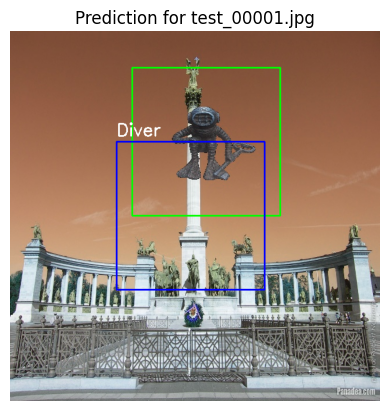

Predicted Bbox: [195, 206, 451, 462]


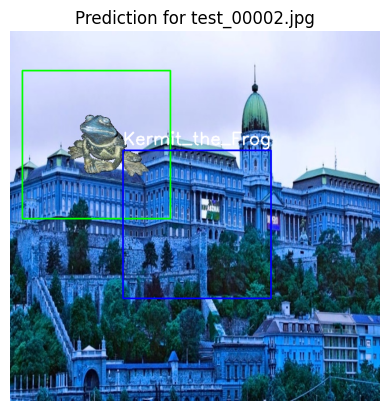

Predicted Bbox: [184, 210, 440, 467]


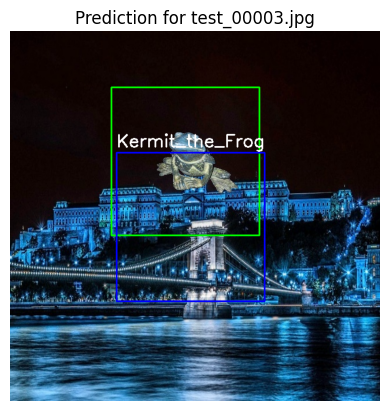

Predicted Bbox: [196, 211, 452, 467]


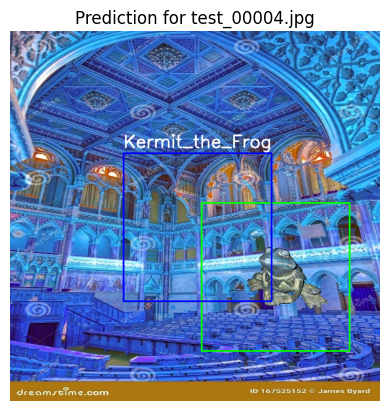

Predicted Bbox: [193, 203, 449, 459]


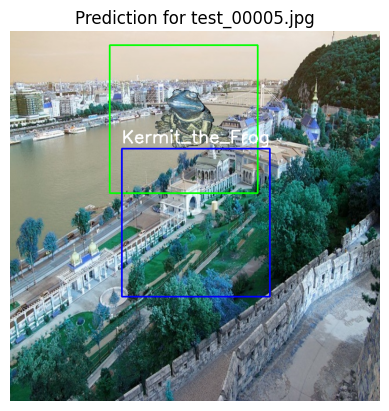

Predicted Bbox: [192, 213, 448, 469]


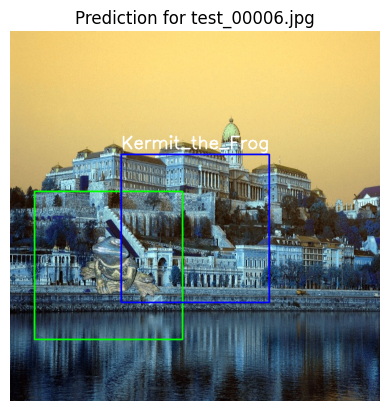

Predicted Bbox: [185, 192, 441, 448]


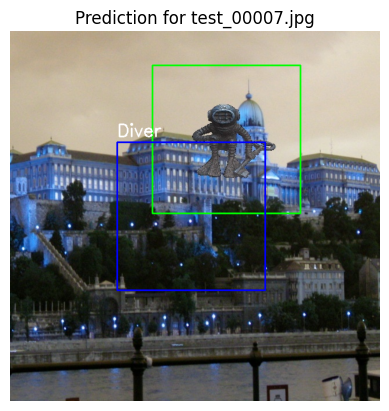

Predicted Bbox: [188, 199, 444, 455]


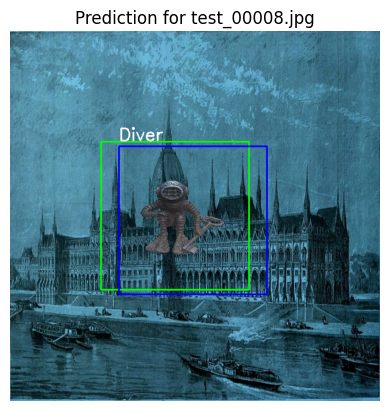

Predicted Bbox: [194, 206, 450, 462]


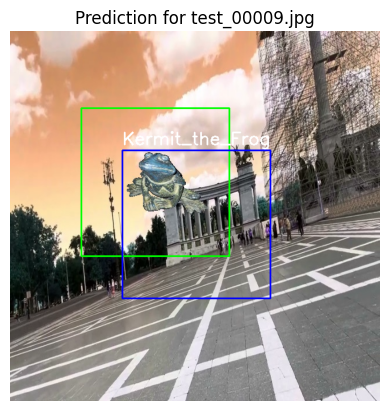

Predicted Bbox: [190, 212, 446, 468]


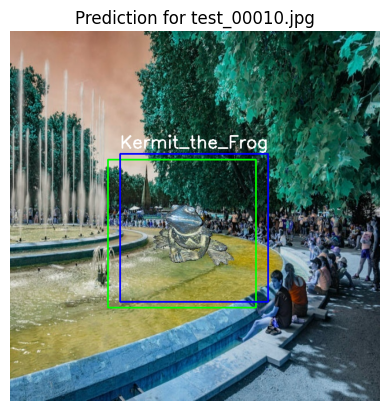

Test Set Accuracy（classification）: 100.00%


In [ ]:
import os
import cv2
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score

# 预测函数
def predict(model, image, device='cuda'):
    model.eval()  # 设置为评估模式

    # 将图像移动到设备并确保是正确的格式
    image = image.to(device).unsqueeze(0)  # 扩展为batch size为1的形状

    with torch.no_grad():
        class_probs, bbox_preds = model(image)  # 前向传播

    # 处理分类结果
    predicted_class = torch.argmax(class_probs, dim=1).item()  # 获取类别索引
    predicted_probs = torch.softmax(class_probs, dim=1)  # 获取各类别的概率分布
    predicted_class_prob = predicted_probs[0, predicted_class].item()  # 获取预测类别的概率

    # 处理边界框回归结果 (假设输出是 YOLO 格式)
    predicted_bbox = bbox_preds[0].cpu().numpy()  # 获取边界框的坐标 (YOLO 格式: x_center, y_center, width, height)

    return predicted_class, predicted_class_prob, predicted_bbox

# 图像预处理函数
def preprocess_image(image_path):
    # 使用 OpenCV 加载图像并转换为RGB
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # 调整图像大小以匹配模型输入 (假设输入为 640x640)
    image_resized = cv2.resize(image, (640, 640))

    # 转换为张量并归一化
    image_tensor = torch.tensor(image_resized).permute(2, 0, 1).float() / 255.0
    return image_tensor

# 将YOLO标签格式转换为像素坐标
def yolo_to_pixel_coords(yolo_bbox, img_width, img_height):
    """
    将 YOLO 格式的边界框转换为像素坐标
    yolo_bbox: (x_center, y_center, width, height) YOLO 形式的边界框
    img_width: 图像的宽度
    img_height: 图像的高度
    返回: (x_min, y_min, x_max, y_max) 像素坐标的边界框
    """
    x_center, y_center, width, height = yolo_bbox
    x_center *= img_width
    y_center *= img_height
    width *= img_width
    height *= img_height

    x_min = int(x_center - width / 2)
    y_min = int(y_center - height / 2)
    x_max = int(x_center + width / 2)
    y_max = int(y_center + height / 2)

    return x_min, y_min, x_max, y_max

# 定义类别名称，根据 YAML 文件
class_names = ['Brexit', 'Car', 'Diver', 'Kermit_the_Frog']

# 测试集目录和标签目录
test_images_path = '/content/yolo_dataset/test/images'
test_labels_path = '/content/yolo_dataset/test/labels'  # 标签文件夹，假设标签是YOLO格式

# 加载模型（确保模型已经训练并加载权重）
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = CustomModel(num_classes=4).to(device)
model.load_state_dict(torch.load('best_model_weights.pth'))  # 加载最佳模型权重

# 用于记录真实类别和预测类别
true_classes = []
predicted_classes = []

# 获取测试集的图像和标签文件
test_image_files = os.listdir(test_images_path)
test_image_files.sort()  # 确保顺序一致
test_label_files = os.listdir(test_labels_path)
test_label_files.sort()

# 只显示前10张图片
for idx, image_file in enumerate(test_image_files[:10]):  # 限制显示前10张图片
    image_path = os.path.join(test_images_path, image_file)
    label_path = os.path.join(test_labels_path, test_label_files[idx])

    # 读取图像并获取图像尺寸
    image = cv2.imread(image_path)
    img_height, img_width, _ = image.shape

    # 读取真实标签和真实边界框（YOLO格式）
    with open(label_path, 'r') as f:
        lines = f.readlines()
        true_class = int(lines[0].strip().split()[0])  # 第一部分是类别索引
        yolo_bbox = [float(x) for x in lines[0].strip().split()[1:]]  # 后面部分是归一化的边界框坐标

    # 将YOLO格式的边界框转换为像素坐标
    x_min_true, y_min_true, x_max_true, y_max_true = yolo_to_pixel_coords(yolo_bbox, img_width, img_height)

    # 预处理图像
    image_tensor = preprocess_image(image_path).to(device)

    # 进行预测
    predicted_class, predicted_class_prob, predicted_bbox = predict(model, image_tensor, device)

    # 记录真实和预测的类别
    true_classes.append(true_class)
    predicted_classes.append(predicted_class)

    # 将预测的YOLO格式边界框转换为像素坐标
    x_min_pred, y_min_pred, x_max_pred, y_max_pred = yolo_to_pixel_coords(predicted_bbox, img_width, img_height)

    # 确保预测的边界框在图像范围内
    x_min_pred = max(0, min(img_width, x_min_pred))
    y_min_pred = max(0, min(img_height, y_min_pred))
    x_max_pred = max(0, min(img_width, x_max_pred))
    y_max_pred = max(0, min(img_height, y_max_pred))

    # 打印预测边界框检查是否正常
    print(f"Predicted Bbox: [{x_min_pred}, {y_min_pred}, {x_max_pred}, {y_max_pred}]")

    # 绘制真实边界框（绿色）
    cv2.rectangle(image, (x_min_true, y_min_true), (x_max_true, y_max_true), (0, 255, 0), 2)

    # 绘制预测边界框（红色）
    cv2.rectangle(image, (x_min_pred, y_min_pred), (x_max_pred, y_max_pred), (0, 0, 255), 2)

    # 显示预测类别和标签，使用类别名称代替索引
    label = f"{class_names[predicted_class]}"
    cv2.putText(image, label, (x_min_pred, y_min_pred - 10), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)

    # 显示图像
    plt.imshow(image)
    plt.title(f"Prediction for {image_file}")
    plt.axis('off')
    plt.show()

# 计算并显示准确率
accuracy = accuracy_score(true_classes, predicted_classes)
print(f"Test Set Accuracy（classification）: {accuracy * 100:.2f}%")


### 2.3. Evaulate and do inference with the trained custom model

Choose **at least 3 metrics** to evaluate your object detection model. These could include:

- **Precision**: The proportion of correctly predicted positive instances (objects detected) out of all instances classified as positive.
- **Recall**: The proportion of correctly predicted positive instances out of all actual positive instances (objects present in the image).
- **F1-Score**: The harmonic mean of Precision and Recall, balancing false positives and false negatives.
- **IoU (Intersection over Union)**: Measures the overlap between the predicted bounding box and the ground truth bounding box.
- **mAP (mean Average Precision)**: This is one of the most common evaluation metrics for object detection. It averages precision at different recall thresholds across all object classes.
  
Additionally, you can assess:
- **Inference speed**: Time taken by the model to process a single image.
- **Number of parameters**: The total number of trainable parameters in the model.
- **Model size**: The disk size of the trained model.

### Show Performance Metric Visualizations

- Visualize the chosen metrics (e.g., **Precision, Recall, F1-Score, IoU, mAP**) over different epochs to demonstrate the improvement in the model’s performance.
- Plot losses (both classification loss and localization loss) to show how they decrease throughout training.

### Show Some Predictions of Your Trained Model

- Display sample images with **predicted bounding boxes** and compare them to the ground truth.
- Highlight the values of **Precision, Recall, IoU**, or other relevant metrics for each displayed prediction, giving a clear view of the model's performance.
  
You can also use **WandB (Weights and Biases)** or **TensorBoard** for more detailed logging and tracking of these metrics and visualizations.


Precision: 0.9795
Recall: 0.9807
F1-Score: 0.9798


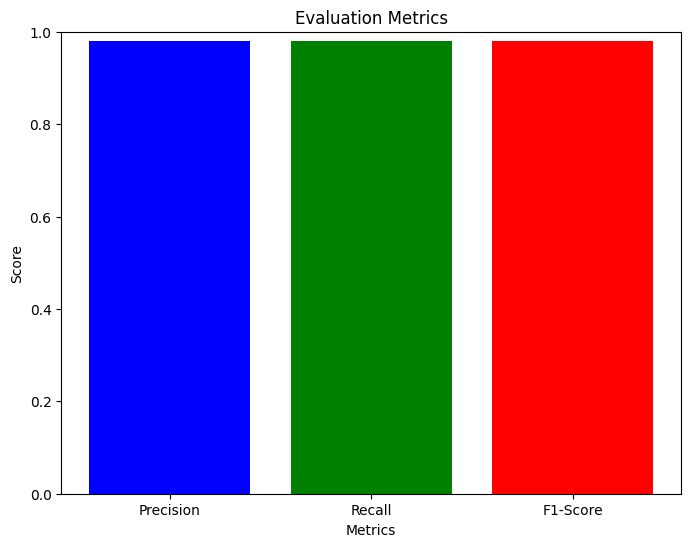

In [ ]:
import yaml
import torch
import numpy as np
from torch.utils.data import DataLoader, Dataset
import os
from PIL import Image
import torchvision.transforms as transforms
from sklearn.metrics import precision_score, recall_score, f1_score  # 导入 f1_score
import matplotlib.pyplot as plt  # 导入 matplotlib

# 1. 解析 data.yaml 文件
def load_yaml_config(yaml_path):
    """加载 data.yaml 文件"""
    with open(yaml_path, 'r') as f:
        config = yaml.safe_load(f)

    # 获取类别名称、类别数量、数据集路径
    class_names = config['names']  # 类别名称
    num_classes = config['nc']  # 类别数量
    test_path = config['test']  # 测试集路径

    return class_names, num_classes, test_path

# 2. 自定义数据集类，用于加载图像和标签
class YoloDataset(Dataset):
    def __init__(self, image_dir, label_dir, transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.image_filenames = os.listdir(image_dir)
        self.transform = transform

    def __len__(self):
        return len(self.image_filenames)

    def __getitem__(self, idx):
        # 获取图像路径
        img_path = os.path.join(self.image_dir, self.image_filenames[idx])
        img = Image.open(img_path).convert('RGB')

        # 获取标签路径
        label_filename = os.path.splitext(self.image_filenames[idx])[0] + '.txt'
        label_path = os.path.join(self.label_dir, label_filename)

        # 读取标签
        boxes = []
        labels = []
        with open(label_path, 'r') as f:
            for line in f:
                class_id, x_center, y_center, width, height = map(float, line.strip().split())
                boxes.append([x_center, y_center, width, height])
                labels.append(int(class_id))

        # 转换图像为 Tensor
        if self.transform:
            img = self.transform(img)

        return img, torch.tensor(labels), torch.tensor(boxes)

# 3. 定义 IoU 计算函数
def compute_iou(box1, box2):
    """计算两个边界框的 IoU"""
    x1_min, y1_min, x1_max, y1_max = box1
    x2_min, y2_min, x2_max, y2_max = box2

    # 计算交集区域
    inter_x_min = max(x1_min, x2_min)
    inter_y_min = max(y1_min, y2_min)
    inter_x_max = min(x1_max, x2_max)
    inter_y_max = min(y1_max, y2_max)

    inter_area = max(0, inter_x_max - inter_x_min) * max(0, inter_y_max - inter_y_min)

    # 计算两个框的面积
    box1_area = (x1_max - x1_min) * (y1_max - y1_min)
    box2_area = (x2_max - x2_min) * (y2_max - y2_min)

    # 计算并集区域
    union_area = box1_area + box2_area - inter_area

    # 计算 IoU
    iou = inter_area / union_area
    return iou

# 4. YOLO 边界框格式转换函数
def convert_yolo_to_xyxy(yolo_box, img_width, img_height):
    """将 YOLO 格式的边界框转换为 (x_min, y_min, x_max, y_max) 格式"""
    # 打印 yolo_box 来检查它的格式
    #print(f"yolo_box: {yolo_box}")

    if isinstance(yolo_box, torch.Tensor):
        yolo_box = yolo_box.cpu().numpy()  # 如果是张量，先转换为 numpy 数组

    if len(yolo_box.shape) == 2 and yolo_box.shape[0] == 1:  # 如果是二维数组，提取第一个元素
        yolo_box = yolo_box[0]

    if len(yolo_box) != 4:
        raise ValueError(f"Expected yolo_box to have 4 elements, but got {len(yolo_box)}")

    # 解包 yolo_box
    x_center, y_center, width, height = yolo_box

    # 计算 x_min, y_min, x_max, y_max
    x_min = (x_center - width / 2) * img_width
    y_min = (y_center - height / 2) * img_height
    x_max = (x_center + width / 2) * img_width
    y_max = (y_center + height / 2) * img_height

    return [x_min, y_min, x_max, y_max]


# def convert_yolo_to_xyxy(yolo_box, img_width, img_height):
#     """将 YOLO 格式的边界框转换为 (x_min, y_min, x_max, y_max) 格式"""
#     x_center, y_center, width, height = yolo_box
#     x_min = (x_center - width / 2) * img_width
#     y_min = (y_center - height / 2) * img_height
#     x_max = (x_center + width / 2) * img_width
#     y_max = (y_center + height / 2) * img_height
#     return [x_min, y_min, x_max, y_max]

# 5. 评估模型的 Precision、Recall 和 F1-score
def evaluate_precision_recall_f1(model, test_loader, device, iou_threshold=0.5):
    model.eval()
    true_labels = []
    pred_labels = []

    with torch.no_grad():
        for images, labels, boxes in test_loader:
            images = images.to(device)
            labels = labels.to(device)
            boxes = boxes.to(device)

            # 模型预测
            class_probs, bbox_preds = model(images)
            predicted_classes = torch.argmax(class_probs, dim=1).cpu().numpy()

            # 假设 bbox_preds 是 YOLO 格式，转换为 [x_min, y_min, x_max, y_max]
            predicted_boxes = []
            for bbox in bbox_preds:
                pred_box = convert_yolo_to_xyxy(bbox.cpu().numpy(), images.shape[3], images.shape[2])
                predicted_boxes.append(pred_box)

            # 比较预测标签与真实标签
            true_labels.extend(labels.cpu().numpy())
            pred_labels.extend(predicted_classes)

    # 使用 sklearn 计算 precision, recall 和 F1-score
    precision = precision_score(true_labels, pred_labels, average='macro')
    recall = recall_score(true_labels, pred_labels, average='macro')
    f1 = f1_score(true_labels, pred_labels, average='macro')  # 增加 F1 计算
    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1-Score: {f1:.4f}")

    return precision, recall, f1

# 6. 可视化 Precision, Recall 和 F1-score
def plot_metrics(precision, recall, f1):
    """可视化 Precision, Recall 和 F1-score"""
    metrics = [precision, recall, f1]
    labels = ['Precision', 'Recall', 'F1-Score']

    plt.figure(figsize=(8, 6))
    plt.bar(labels, metrics, color=['blue', 'green', 'red'])
    plt.xlabel('Metrics')
    plt.ylabel('Score')
    plt.title('Evaluation Metrics')
    plt.ylim(0, 1)  # 设置 y 轴范围为 0 到 1
    plt.show()

# 7. 解析 YAML 文件
yaml_path = '/content/yolo_dataset/data.yaml'
class_names, num_classes, test_path = load_yaml_config(yaml_path)

# 8. 数据转换为张量
transform = transforms.Compose([
    transforms.Resize((640, 640)),  # 根据模型输入大小调整
    transforms.ToTensor()
])

# 9. 创建数据集和 DataLoader
test_images_dir = test_path
test_labels_dir = test_path.replace('images', 'labels')  # 假设标签路径与图像路径一致，只是文件夹名不同
test_dataset = YoloDataset(image_dir=test_images_dir, label_dir=test_labels_dir, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# 10. 加载模型和模型权重
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# 假设您有一个定义好的模型类 `CustomModel`
model = CustomModel(num_classes=num_classes).to(device)  # 使用 yaml 文件中的类别数量
model.load_state_dict(torch.load('/content/best_model_weights.pth', weights_only=True))  # 加载模型权重

# 11. 评估 Precision、Recall 和 F1-score
precision, recall, f1 = evaluate_precision_recall_f1(model, test_loader, device)

# 12. 可视化 Precision、Recall 和 F1-score
plot_metrics(precision, recall, f1)





### 2.4. Load an Existing Object Detection Model

We recommend using the latest **YOLO** version, but you are free to choose any other **PyTorch-based** object detection model.


In [ ]:
# ADD YOUR CODE HERE
!pip install ultralytics



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 877.6/877.6 kB 55.4 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# 加载预训练的 YOLOv8 模型
model = YOLO('yolov8n.pt')

# 训练模型，确保 data.yaml 路径正确
model.train(data='/content/yolo_dataset/data.yaml', epochs=50, imgsz=640)


Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


100%|██████████| 6.25M/6.25M [00:00<00:00, 346MB/s]

Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/content/yolo_dataset/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show

100%|██████████| 755k/755k [00:00<00:00, 79.8MB/s]


Overriding model.yaml nc=80 with nc=4

                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      7360  ultralytics.nn.modules.block.C2f             [32, 32, 1, True]             
  3                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  4                  -1  2     49664  ultralytics.nn.modules.block.C2f             [64, 64, 2, True]             
  5                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  6                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  7                  -1  1    295424  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 287MB/s]
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:262: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:267: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context:

AMP: checks passed ✅


train: Scanning /content/yolo_dataset/train/labels... 1600 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1600/1600 [00:01<00:00, 1233.50it/s]


train: New cache created: /content/yolo_dataset/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:13: UserWarning: A new version of Albumentations is available: 1.4.20 (you have 1.4.15). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /content/yolo_dataset/val/labels... 200 images, 0 backgrounds, 0 corrupt: 100%|██████████| 200/200 [00:00<00:00, 968.49it/s] 

val: New cache created: /content/yolo_dataset/val/labels.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       1/50      4.87G      1.525      2.772      1.654         34        640: 100%|██████████| 100/100 [00:11<00:00,  8.35it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.984      0.985      0.994      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       2/50      2.33G     0.9902      1.432      1.218         28        640: 100%|██████████| 100/100 [00:10<00:00,  9.91it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200       0.99          1      0.995      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       3/50      2.35G     0.8894      1.154      1.147         38        640: 100%|██████████| 100/100 [00:09<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.864



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       4/50      2.35G     0.8049     0.9618       1.11         26        640: 100%|██████████| 100/100 [00:09<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.985      0.994      0.995      0.878

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       5/50      2.35G     0.7317     0.8302      1.074         35        640: 100%|██████████| 100/100 [00:09<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.993      0.973      0.989      0.846

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       6/50      2.35G     0.6905     0.7517      1.044         23        640: 100%|██████████| 100/100 [00:09<00:00, 10.16it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.994          1      0.995      0.924



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       7/50      2.35G     0.6291     0.6741      1.019         22        640: 100%|██████████| 100/100 [00:09<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.997          1      0.995      0.944



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       8/50      2.35G     0.6326     0.6848      1.022         30        640: 100%|██████████| 100/100 [00:09<00:00, 10.36it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.993          1      0.995      0.933



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
       9/50      2.35G     0.5954     0.6232      1.016         36        640: 100%|██████████| 100/100 [00:09<00:00, 10.26it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.997          1      0.995      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      10/50      2.35G     0.5832     0.6167          1         27        640: 100%|██████████| 100/100 [00:09<00:00, 10.52it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.997      0.999      0.995       0.98



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      11/50      2.35G     0.5516     0.5781     0.9843         35        640: 100%|██████████| 100/100 [00:09<00:00, 10.32it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998      0.999      0.995      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      12/50      2.35G     0.5403     0.5924     0.9803         33        640: 100%|██████████| 100/100 [00:09<00:00, 10.17it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.977

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      13/50      2.35G     0.5143     0.5458     0.9742         33        640: 100%|██████████| 100/100 [00:09<00:00, 10.38it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.949



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      14/50      2.35G     0.5084      0.515      0.968         29        640: 100%|██████████| 100/100 [00:09<00:00, 10.14it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.997          1      0.995      0.962



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      15/50      2.35G     0.5117     0.5455     0.9735         31        640: 100%|██████████| 100/100 [00:09<00:00, 10.35it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.987

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      16/50      2.35G     0.4823      0.498     0.9592         36        640: 100%|██████████| 100/100 [00:09<00:00, 10.62it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      17/50      2.35G     0.4623     0.5072     0.9589         31        640: 100%|██████████| 100/100 [00:09<00:00, 10.20it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      18/50      2.35G     0.4627     0.4924     0.9547         34        640: 100%|██████████| 100/100 [00:09<00:00, 10.47it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      19/50      2.35G     0.4447      0.492     0.9501         26        640: 100%|██████████| 100/100 [00:10<00:00,  9.93it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      20/50      2.35G     0.4388     0.4709      0.949         31        640: 100%|██████████| 100/100 [00:09<00:00, 10.09it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.958



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      21/50      2.35G     0.4322     0.4749     0.9428         43        640: 100%|██████████| 100/100 [00:09<00:00, 10.26it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      22/50      2.35G     0.4059     0.4374     0.9314         35        640: 100%|██████████| 100/100 [00:09<00:00, 10.36it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      23/50      2.35G     0.4192     0.4418     0.9341         28        640: 100%|██████████| 100/100 [00:09<00:00, 10.26it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      24/50      2.35G     0.4166      0.453     0.9313         31        640: 100%|██████████| 100/100 [00:09<00:00, 10.41it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      25/50      2.35G     0.3855      0.424     0.9226         19        640: 100%|██████████| 100/100 [00:09<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      26/50      2.35G     0.3987     0.4439     0.9369         34        640: 100%|██████████| 100/100 [00:09<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.992



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      27/50      2.35G     0.3748     0.4145     0.9181         32        640: 100%|██████████| 100/100 [00:09<00:00, 10.56it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      28/50      2.35G     0.3773     0.4032      0.922         27        640: 100%|██████████| 100/100 [00:09<00:00, 10.32it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.986



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      29/50      2.35G     0.3639     0.4012     0.9156         20        640: 100%|██████████| 100/100 [00:09<00:00, 10.30it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.993



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      30/50      2.35G     0.3651     0.4063     0.9202         31        640: 100%|██████████| 100/100 [00:09<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.989



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      31/50      2.35G     0.3577     0.3905     0.9143         31        640: 100%|██████████| 100/100 [00:09<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      32/50      2.35G     0.3444     0.3716     0.9085         22        640: 100%|██████████| 100/100 [00:09<00:00, 10.34it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      33/50      2.35G     0.3363     0.3729     0.9047         35        640: 100%|██████████| 100/100 [00:09<00:00, 10.57it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      34/50      2.35G      0.352     0.3976     0.9188         33        640: 100%|██████████| 100/100 [00:09<00:00, 10.24it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      35/50      2.35G     0.3498     0.4041     0.9164         34        640: 100%|██████████| 100/100 [00:09<00:00, 10.22it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.994

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      36/50      2.35G     0.3299     0.3873     0.9116         28        640: 100%|██████████| 100/100 [00:09<00:00, 10.44it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      37/50      2.35G     0.3263     0.3727     0.9053         20        640: 100%|██████████| 100/100 [00:09<00:00, 10.22it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.998          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      38/50      2.35G     0.3251     0.3689     0.9039         32        640: 100%|██████████| 100/100 [00:09<00:00, 10.01it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.994



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      39/50      2.35G      0.316     0.3695     0.8998         26        640: 100%|██████████| 100/100 [00:09<00:00, 10.42it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      40/50      2.35G     0.3029     0.3478     0.8997         36        640: 100%|██████████| 100/100 [00:09<00:00, 10.18it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      41/50      2.42G      0.135     0.1282     0.7927         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.03it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      42/50      2.35G     0.1266     0.1136     0.7928         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.42it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      43/50      2.35G     0.1289     0.1136     0.7914         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.37it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      44/50      2.35G     0.1185      0.106     0.7901         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.67it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      45/50      2.35G     0.1109     0.1008     0.7788         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.50it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      46/50      2.35G     0.1085    0.09864     0.7871         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.32it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      47/50      2.35G     0.1028    0.09426     0.7843         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.80it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      48/50      2.35G    0.09496     0.0888     0.7785         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.28it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      49/50      2.35G    0.09241    0.08625     0.7865         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.46it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200      0.999          1      0.995      0.995



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


  0%|          | 0/100 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/utils/loss.py:202: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  pred_dist = pred_dist.view(b, a, 4, c // 4).softmax(3).matmul(self.proj.type(pred_dist.dtype))
      50/50      2.35G    0.08737    0.08225     0.7793         16        640: 100%|██████████| 100/100 [00:09<00:00, 10.69it/s]
                 Class     Images  Instances      Box(P          R   

                   all        200        200          1          1      0.995      0.995



50 epochs completed in 0.158 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 6.2MB
Optimizer stripped from runs/detect/train/weights/best.pt, 6.2MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.23 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (NVIDIA L4, 22700MiB)
Model summary (fused): 168 layers, 3,006,428 parameters, 0 gradients, 8.1 GFLOPs


/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:262: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operation is not deterministic because it uses CuBLAS and you have CUDA >= 10.2. To enable deterministic behavior in this case, you must set an environment variable before running your PyTorch application: CUBLAS_WORKSPACE_CONFIG=:4096:8 or CUBLAS_WORKSPACE_CONFIG=:16:8. For more information, go to https://docs.nvidia.com/cuda/cublas/index.html#results-reproducibility (Triggered internally at ../aten/src/ATen/Context.cpp:208.)
  fusedconv.weight.copy_(torch.mm(w_bn, w_conv).view(fusedconv.weight.shape))
/usr/local/lib/python3.10/dist-packages/ultralytics/utils/torch_utils.py:267: UserWarning: Deterministic behavior was enabled with either `torch.use_deterministic_algorithms(True)` or `at::Context::setDeterministicAlgorithms(true)`, but this operati

                   all        200        200          1          1      0.995      0.995
                Brexit         55         55      0.999          1      0.995      0.995
                   Car         51         51          1          1      0.995      0.995
                 Diver         54         54          1          1      0.995      0.995
       Kermit_the_Frog         40         40          1          1      0.995      0.995
Speed: 0.2ms preprocess, 1.0ms inference, 0.0ms loss, 1.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1, 2, 3])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e849f4ee800>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0

### 2.5. Fine-tune the existing object detection model
If you choose to use **YOLO**, training the model can be done easily by providing a `data.yaml` file (which follows a specific format, check the official GitHub repository for details) and running the training script.

For example, you can run YOLO from the command line with:

```bash
!yolo task=detect mode=train data=datasets/data.yaml model=yolov8n.yaml epochs=200 imgsz=640
```

Make sure to show the losses and metrics visualizations. By default, YOLO should **verbose** those.

In [ ]:
# ADD YOUR CODE HERE

### 2.6 Evaluate the existing object detection model
**Compare the performance** of your custom model and the YOLO model, ensuring both are evaluated on the **same subset of images** using the **same metrics** chosen in **Step 2.3** (e.g., Precision, Recall, F1-Score, IoU, mAP).


Found 10 matching images: ['F1_curve.png', 'results.png', 'confusion_matrix_normalized.png', 'val_batch2_labels.jpg', 'labels_correlogram.jpg', 'val_batch1_labels.jpg', 'val_batch0_labels.jpg', 'PR_curve.png', 'labels.jpg', 'confusion_matrix.png']


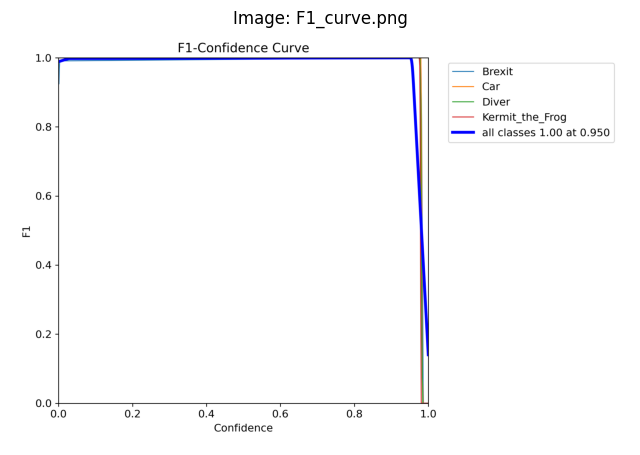

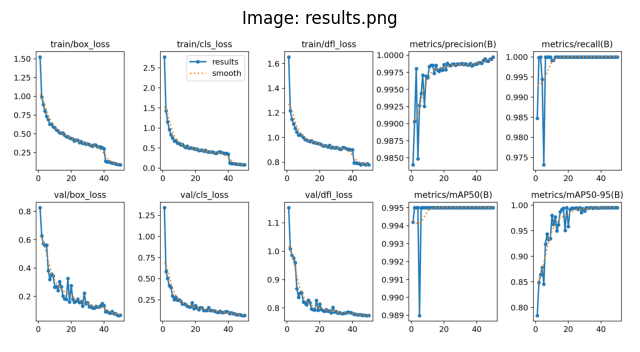

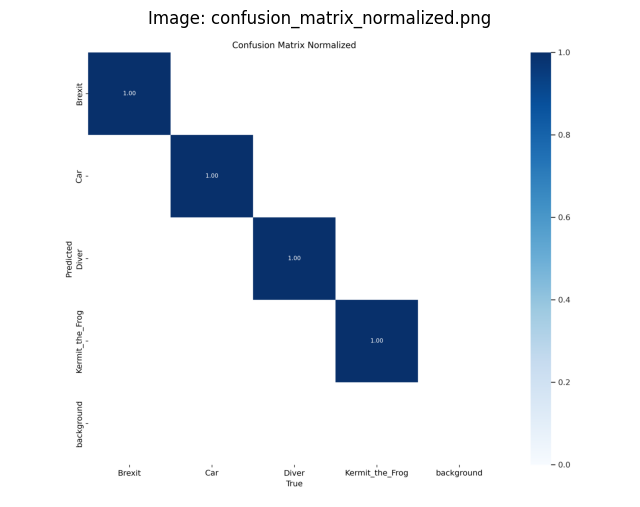

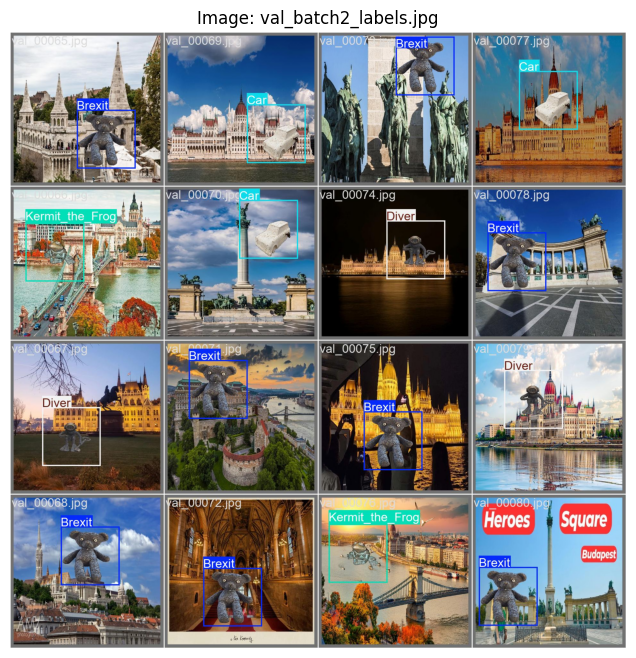

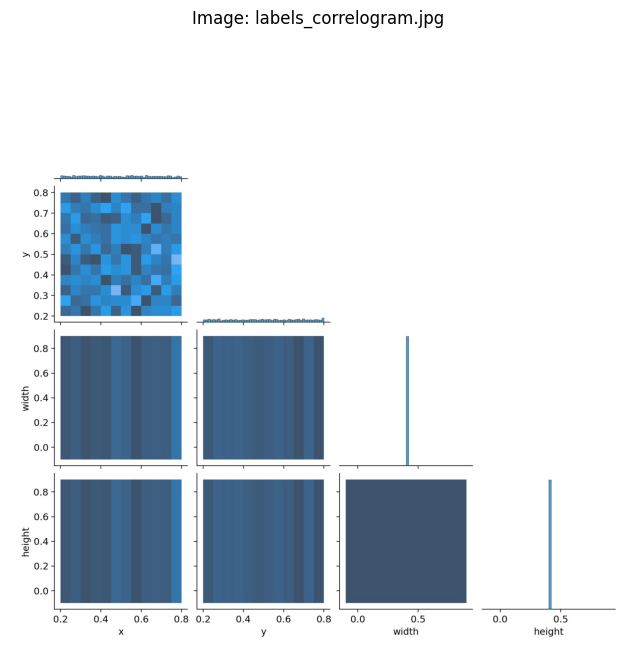

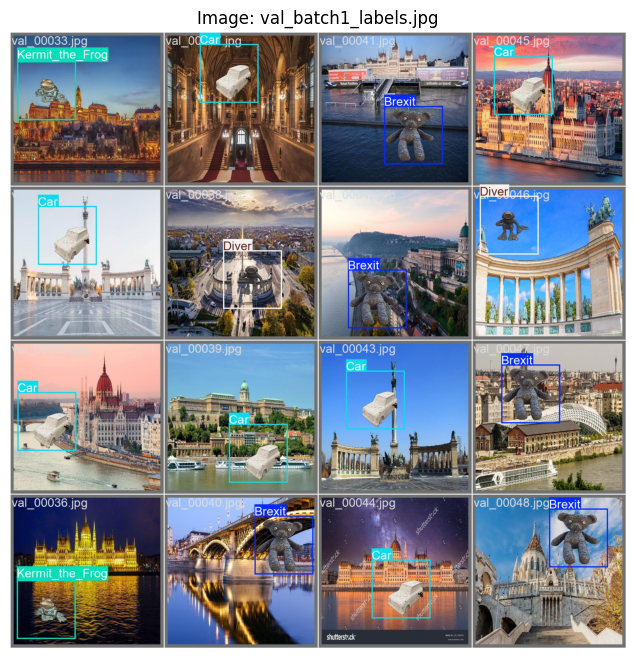

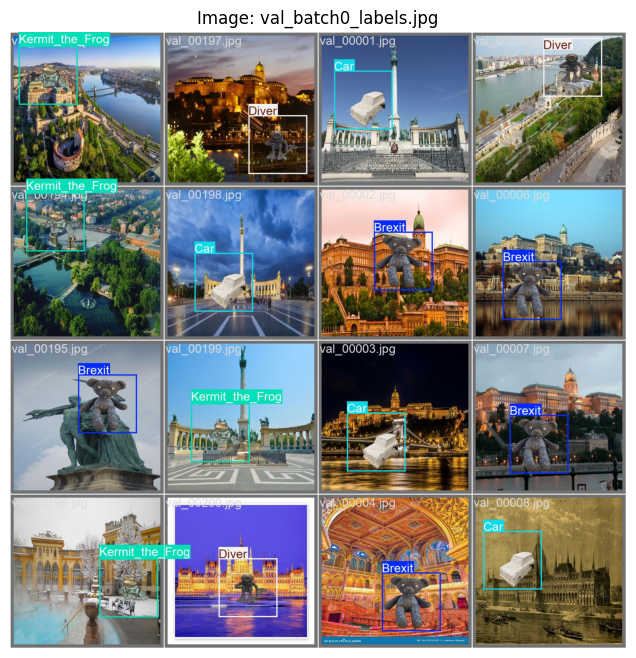

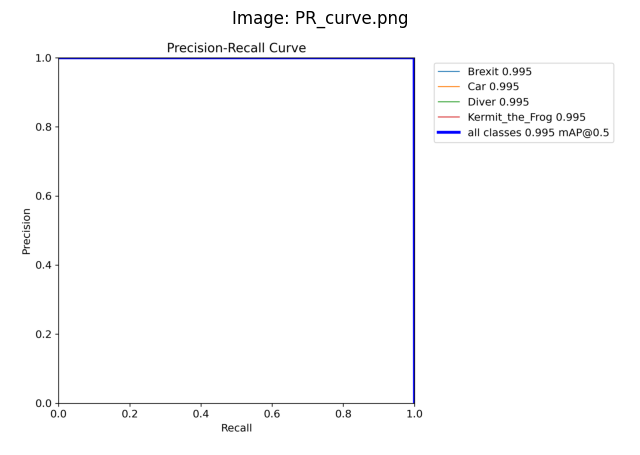

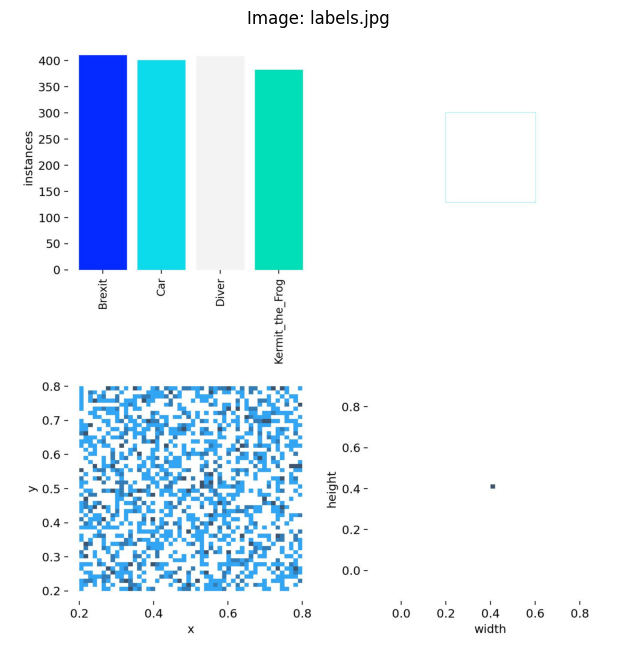

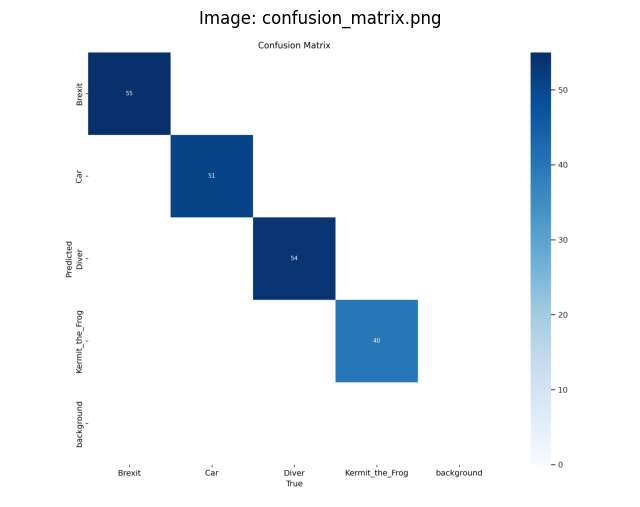

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

# 定义要搜索的关键字
keywords = ['F1', 'PR', 'confusion_matrix', 'labels', 'results']

# 图片目录路径
image_dir = '/content/runs/detect/train'

# 查找符合关键字且扩展名为 jpg 或 png 的图片
matching_images = [
    img for img in os.listdir(image_dir)
    if (img.endswith('.jpg') or img.endswith('.png')) and any(keyword in img for keyword in keywords)
]

# 打印找到的图片文件
print(f"Found {len(matching_images)} matching images: {matching_images}")

# 显示符合条件的图片
for img_filename in matching_images:
    img_path = os.path.join(image_dir, img_filename)
    img = Image.open(img_path)

    # 显示图片
    plt.figure(figsize=(8, 8))
    plt.imshow(img)
    plt.axis('off')  # 不显示坐标轴
    plt.title(f"Image: {img_filename}")
    plt.show()




# 3. COMPARISON
**Compare the performance** of your custom model and the YOLO model, ensuring both are evaluated on the **same subset of images** for a fair comparison. Key metrics to include:

- **Precision**
- **Recall**
- **F1-Score**
- **IoU (Intersection over Union)**
- **mAP (mean Average Precision)**

### Visualize Predictions

- Show predictions from both models on the same images.
- Include bounding boxes, class labels, and relevant metrics like IoU or Precision.

### Explain Differences

- Discuss why one model may perform better than the other, considering architecture, dataset complexity, or fine-tuning.

### Improve Custom Model

- Suggest improvements such as better data augmentation, model architecture adjustments, hyperparameter tuning, or more training data.
- Explore **Transfer Learning**, **learning rate scheduling**, or new optimizers for better performance.


In [ ]:
# ADD YOUR CODE HERE